---
title: "Clustering"
format: html
execute:
    echo: true
code-fold: true
link-external-newwindow: true
bibliography: reference.bib
website:
  back-to-top-navigation: true
---

## Introduction

In this clustering analysis, we will explore a dataset containing various music attributes for songs within the Electronic Dance Music (EDM) subgenres. These attributes include loudness, acousticness, danceability, tempo, energy, and more. The dataset is sourced from Spotify and provides valuable insights into the characteristics of songs in different EDM subgenres. While the dataset originally includes labeled data associating songs with their respective subgenres, for the purpose of clustering analysis, we will remove these labels to allow the algorithms to identify patterns and group songs based on their inherent characteristics.

Our primary goal in this analysis is to employ clustering techniques, including k-means, DBSCAN, and Hierarchical clustering, to group similar songs within the EDM subgenres. By doing so, we aim to uncover underlying patterns and structure within the EDM music landscape. Ideally, this analysis will enable us to segregate songs into clusters that reflect their commonalities in terms of musical features. Ultimately, our objective is to gain a deeper understanding of the subgenres within EDM and how songs can be grouped based on their intrinsic musical attributes. This insight can be valuable for music recommendation systems, genre classification, and understanding the diversity within EDM.

## Theory

### K-means Clustering:

K-means clustering is a popular method for partitioning data into distinct clusters. The big idea behind K-means is to group data points based on their similarity. It does this by first randomly placing a set of centroids (representative points) in the data space. Then, it assigns each data point to the nearest centroid, forming initial clusters. After that, it recalculates the centroids as the mean of all data points in each cluster. This process iteratively continues until the centroids no longer change significantly, which signifies convergence.

To determine the optimal number of clusters (k) in K-means, model selection methods like the "elbow method" are often used. The elbow method involves plotting the cost or inertia (sum of squared distances between data points and their assigned centroids) against different values of k. The point where the cost starts to level off, forming an "elbow" in the plot, is considered an optimal value for k.

### DBSCAN (Density-Based Spatial Clustering of Applications with Noise):

DBSCAN is a density-based clustering method that identifies clusters as areas of high data point density separated by areas of lower density. It works by defining two parameters: a radius (ε) and a minimum number of data points (MinPts). The algorithm starts with an arbitrary data point and checks if there are at least MinPts data points within a distance of ε from it. If yes, it forms a cluster around that point and expands it by finding more dense data points in its neighborhood. This process continues until no more points can be added to the cluster.

DBSCAN doesn't require specifying the number of clusters in advance, making it well-suited for datasets where the number of clusters is not known. Model selection methods like the silhouette score can be used to assess the quality of clustering. The silhouette score measures the cohesion within clusters and separation between clusters. A higher silhouette score indicates better clustering.

### Hierarchical Clustering:

Hierarchical clustering builds a hierarchy of clusters, where clusters can be nested within one another. There are two main approaches to hierarchical clustering: agglomerative (bottom-up) and divisive (top-down). In the agglomerative method, each data point starts as its own cluster, and at each step, the two closest clusters are merged into a single cluster. This process continues until all data points belong to a single cluster. In the divisive method, all data points initially belong to one cluster, and at each step, the cluster is split into two smaller clusters.

To determine the number of clusters in hierarchical clustering, a dendrogram is often used. A dendrogram is a tree-like structure that displays the sequence of merges or splits. The optimal number of clusters can be chosen by cutting the dendrogram at a point that makes sense in the context of the data.

These clustering methods offer different ways to group data points based on their similarities and differences, and model selection methods help in identifying the most appropriate clustering structure for a given dataset.

## Methods

### Data Selection
Below I have imported my EDM subgenre dataset, and then selected only numeric values to be included so it can be used for clustering analyses (this way the labeled column of 'genre' is not included).

In [ ]:
import pandas as pd

df = pd.read_csv('../clean_data/edm_subgenres/edm_subgenres_bal.csv')
# Convert 'loudness' from decibel to linear scale
df['loudness_linear'] = 10 ** (df['loudness'] / 20.0)


In [ ]:
from sklearn.preprocessing import StandardScaler

# Select numeric features
features = df.select_dtypes(include='number')

# Standardize the data
scaler = StandardScaler()
standardized_data = scaler.fit_transform(features)

features


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_mins,time_signature,loudness_linear
0,0.452,0.927,9.0,-6.496,0.0,0.0330,0.009460,0.353000,0.1180,0.0372,131.984,3.523433,4.0,0.473369
1,0.521,0.861,1.0,-7.398,0.0,0.0298,0.000998,0.845000,0.2990,0.0600,127.995,3.843733,4.0,0.426678
2,0.711,0.743,11.0,-8.672,0.0,0.0487,0.061200,0.009020,0.0839,0.0922,124.020,5.165317,4.0,0.368468
3,0.466,0.874,7.0,-7.243,1.0,0.0437,0.000264,0.878000,0.1340,0.2420,130.001,6.923067,4.0,0.434360
4,0.572,0.859,2.0,-5.539,1.0,0.0406,0.000799,0.733000,0.0688,0.4730,118.988,4.138083,4.0,0.528506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18925,0.513,0.726,9.0,-6.402,1.0,0.0362,0.000064,0.344000,0.0698,0.0485,129.924,3.446150,4.0,0.478520
18926,0.758,0.911,0.0,-3.023,1.0,0.3440,0.107000,0.005460,0.3070,0.4430,139.902,3.115600,4.0,0.706074
18927,0.669,0.959,11.0,-5.192,0.0,0.1930,0.007450,0.855000,0.1550,0.3230,140.018,3.657133,4.0,0.550047
18928,0.615,0.966,8.0,-3.048,1.0,0.0896,0.003130,0.012400,0.0705,0.1370,153.024,3.555550,4.0,0.704044


### Hyper Parameter Tuning

#### K-Means

For my K-means analysis of the EDM subgenre dataset, I used the elbow and silohuette methods to help determine the optimal value for k. In the elbow graph shown below, typically the optimal value will be where the graph starts to plateau. However, in this graph there is not a clear indication of convergence, so I will also look at the silohuette graph. In the silohuette graph, the optimal value for k will be where the graph has the highest silohuette score. In this case, that would be 3.


In [ ]:
# Elbow method
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

distortions = []
K = range(1, 50)  # Try different values of k

for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(standardized_data)
    distortions.append(kmeanModel.inertia_)


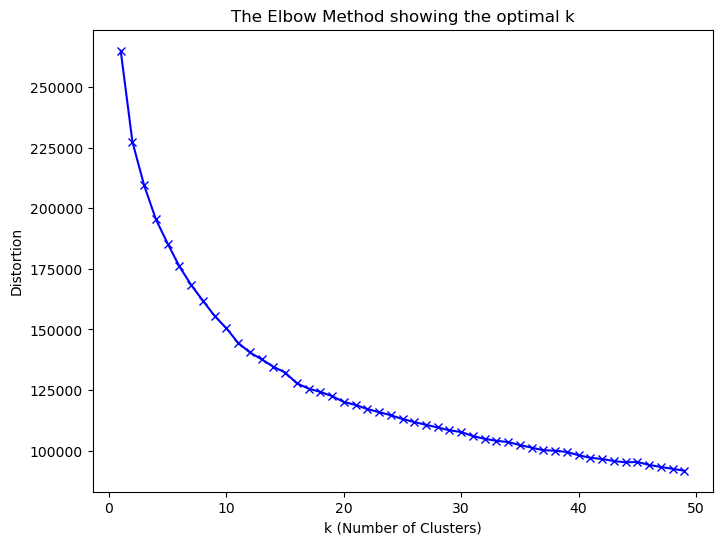

In [ ]:
# Plot the elbow
plt.figure(figsize=(8, 6))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k (Number of Clusters)')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
K = range(2, 11)  # Try different values of k

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0)
    labels = kmeans.fit_predict(standardized_data)
    silhouette_avg = silhouette_score(standardized_data, labels)
    silhouette_scores.append(silhouette_avg)


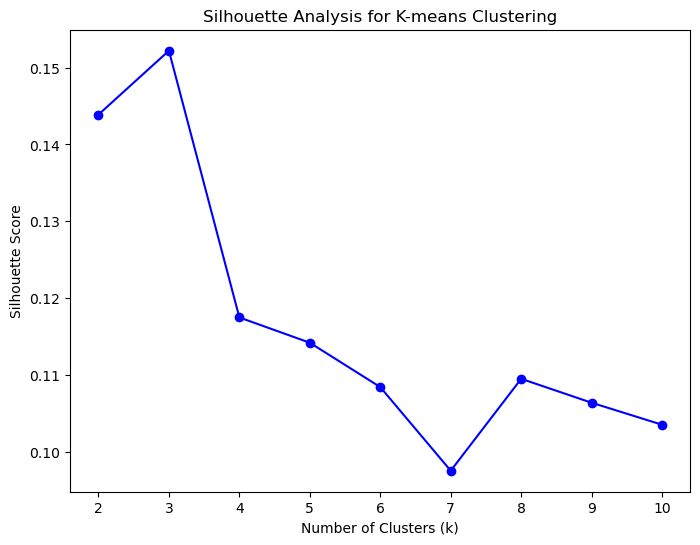

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.plot(K, silhouette_scores, 'bo-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis for K-means Clustering')
plt.show()


### DBSCAN

For DBSCAN, I used the Silhouette method to find the optimal parameter for the clustering. The results of the below graph indicate the optimal parameter is 7, although we can also argue that we could use 5 as the silhouette score is nearly the same for 5 as it is for 7 (and we know that are true cluster groups is 5, so we will use 5).

In [ ]:
import sklearn.cluster

# THIS WILL ITERATE OVER ONE HYPER-PARAMETER (GRID SEARCH) 
# AND RETURN THE CLUSTER RESULT THAT OPTIMIZES THE SILHOUETTE SCORE
def maximize_silhouette(X,algo="birch",nmax=20,i_plot=False):

    # PARAM
    i_print=False

    #FORCE CONTIGUOUS
    X=np.ascontiguousarray(X) 

    # LOOP OVER HYPER-PARAM
    params=[]; sil_scores=[]
    sil_max=-10
    for param in range(2,nmax+1):
        if(algo=="birch"):
            model = sklearn.cluster.Birch(n_clusters=param).fit(X)
            labels=model.predict(X)

        if(algo=="ag"):
            model = sklearn.cluster.AgglomerativeClustering(n_clusters=param).fit(X)
            labels=model.labels_

        if(algo=="dbscan"):
            param=0.5*(param-1)
            model = sklearn.cluster.DBSCAN(eps=param).fit(X)
            labels=model.labels_

        if(algo=="kmeans"):
            model = sklearn.cluster.KMeans(n_clusters=param).fit(X)
            labels=model.predict(X)

        try:
            sil_scores.append(sklearn.metrics.silhouette_score(X,labels))
            params.append(param)
        except:
            continue 

        if(i_print): print(param,sil_scores[-1])
        
        if(sil_scores[-1]>sil_max):
             opt_param=param
             sil_max=sil_scores[-1]
             opt_labels=labels

    print("OPTIMAL PARAMETER =",opt_param)

    if(i_plot):
        fig, ax = plt.subplots()
        ax.plot(params, sil_scores, "-o")  
        ax.set(xlabel='Hyper-parameter', ylabel='Silhouette')
        plt.show()

    return opt_labels

OPTIMAL PARAMETER = 7.0


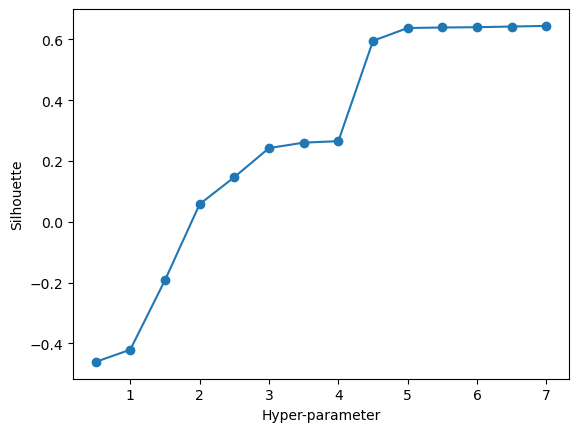

NameError: name 'plot' is not defined

In [ ]:
# DBSCAN
import numpy as np
import matplotlib.pyplot as plt

opt_labels=maximize_silhouette(standardized_data,algo="dbscan",nmax=15, i_plot=True)
plot(standardized_data,opt_labels)

### Hierarchical Clustering

In the below graph, the optimal parameter for hierarchical clustering is shown to be 11. However, since at the hyperparameter of 6 the silhouette score has a negligible difference from hyperparameter 11, we can also use 6, which is closer to our actual number of clusters of 5.

In [ ]:
import sklearn.cluster

# THIS WILL ITERATE OVER ONE HYPER-PARAMETER (GRID SEARCH)
# AND RETURN THE CLUSTER RESULT THAT OPTIMIZES THE SILHOUETTE SCORE
def maximize_silhouette(X,algo="ag",nmax=20,i_plot=False):

    # PARAM
    i_print=False

    #FORCE CONTIGUOUS
    X=np.ascontiguousarray(X)

    # LOOP OVER HYPER-PARAM
    params=[]; sil_scores=[]
    sil_max=-10
    for param in range(2,nmax+1):
        if(algo=="birch"):
            model = sklearn.cluster.Birch(n_clusters=param).fit(X)
            labels=model.predict(X)

        if(algo=="ag"):
            model = sklearn.cluster.AgglomerativeClustering(n_clusters=param).fit(X)
            labels=model.labels_

        if(algo=="dbscan"):
            param=0.25*(param-1)
            model = sklearn.cluster.DBSCAN(eps=param).fit(X)
            labels=model.labels_

        if(algo=="kmeans"):
            model = sklearn.cluster.KMeans(n_clusters=param).fit(X)
            labels=model.predict(X)

        try:
            sil_scores.append(sklearn.metrics.silhouette_score(X,labels))
            params.append(param)
        except:
            continue

        if(i_print): print(param,sil_scores[-1])

        if(sil_scores[-1]>sil_max):
             opt_param=param
             sil_max=sil_scores[-1]
             opt_labels=labels

    print("OPTIMAL PARAMETER =",opt_param)

    if(i_plot):
        fig, ax = plt.subplots()
        ax.plot(params, sil_scores, "-o")
        ax.set(xlabel='Hyper-parameter', ylabel='Silhouette')
        plt.show()

    return opt_labels

OPTIMAL PARAMETER = 11


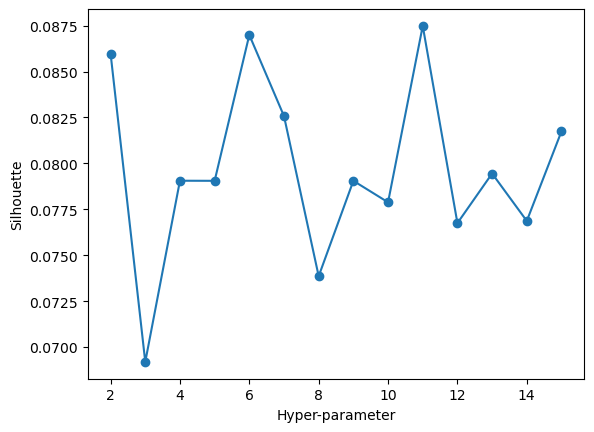

NameError: name 'plot' is not defined

In [ ]:
opt_labels=maximize_silhouette(standardized_data,algo="ag",nmax=15, i_plot=True)
plot(standardized_data,opt_labels)

## Final Results/Conclusions

### K-Means
Using the optimal value for k from the silohuette method, 3, the graph below shows the final results of the k-means clustering. Using a scatterplot between 'tempo' and 'energy', the 3 different clusters are denoted by the different colors. It is noticeable that those with higher energy are grouped together, and lower energy grouped together. Overall, we know that the dataset has 5 actual targets (the 5 different genres), however based on the silohuette method, the optimal value for k was only 3. We may need a larger dataset in order to truly find the distinct differences between the genres.


In [ ]:
# Choose the optimal k
optimal_k = 3 

# Apply K-means with the chosen k
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
clusters = kmeans.fit_predict(standardized_data)

# Add the cluster labels back to your DataFrame
df['Cluster'] = clusters


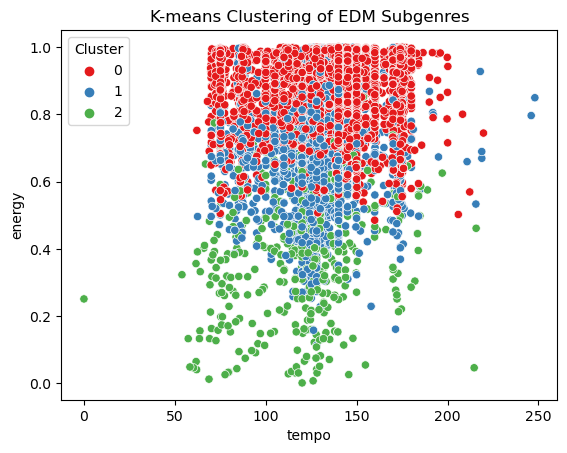

In [ ]:
import seaborn as sns

sns.scatterplot(x='tempo', y= 'energy', hue='Cluster', data=df, palette='Set1')
plt.title('K-means Clustering of EDM Subgenres')
plt.show()


/Users/schenfeldp/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


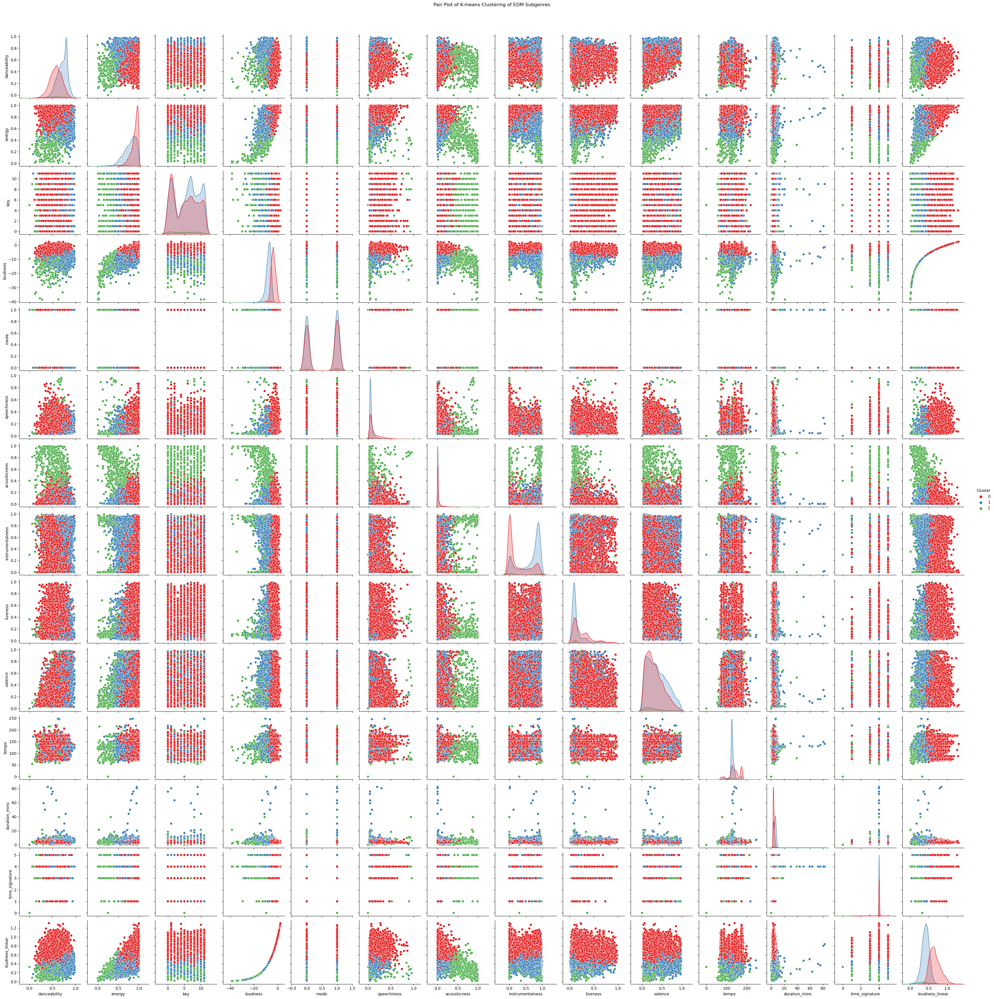

In [ ]:
import seaborn as sns
sns.pairplot(df, hue='Cluster', palette='Set1')
plt.suptitle('Pair Plot of K-means Clustering of EDM Subgenres', y=1.02)
plt.show()

### DBSCAN
From the results of the DBSCAN as shown in the pairplot, this algorithm did not work well on my data. This could be due to the data quality as the different genres are too similar and I would benefit from a larger dataset. Testing out these unsupervised learning methods is more of an exercise as in this case we already know the labels of the data.


In [ ]:
import sklearn.cluster

# THIS WILL ITERATE OVER ONE HYPER-PARAMETER (GRID SEARCH) 
# AND RETURN THE CLUSTER RESULT THAT OPTIMIZES THE SILHOUETTE SCORE
def maximize_silhouette(X,algo="dbscan",nmax=20,i_plot=False):

    # PARAM
    i_print=False

    #FORCE CONTIGUOUS
    X=np.ascontiguousarray(X) 

    # LOOP OVER HYPER-PARAM
    params=[]; sil_scores=[]
    sil_max=-10
    for param in range(2,nmax+1):
        if(algo=="birch"):
            model = sklearn.cluster.Birch(n_clusters=param).fit(X)
            labels=model.predict(X)

        if(algo=="ag"):
            model = sklearn.cluster.AgglomerativeClustering(n_clusters=param).fit(X)
            labels=model.labels_

        if(algo=="dbscan"):
            param=0.5*(param-1)
            model = sklearn.cluster.DBSCAN(eps=param).fit(X)
            labels=model.labels_

        if(algo=="kmeans"):
            model = sklearn.cluster.KMeans(n_clusters=param).fit(X)
            labels=model.predict(X)

        try:
            sil_scores.append(sklearn.metrics.silhouette_score(X,labels))
            params.append(param)
        except:
            continue 

        if(i_print): print(param,sil_scores[-1])
        
        if(sil_scores[-1]>sil_max):
             opt_param=param
             sil_max=sil_scores[-1]
             opt_labels=labels

    print("OPTIMAL PARAMETER =",opt_param)

    if(i_plot):
        fig, ax = plt.subplots()
        ax.plot(params, sil_scores, "-o")  
        ax.set(xlabel='Hyper-parameter', ylabel='Silhouette')
        plt.show()

    return opt_labels

In [ ]:
from sklearn.cluster import DBSCAN

# Create a DBSCAN instance with the optimal number of clusters (5)
dbscan = DBSCAN(eps=0.5, min_samples=5, n_clusters=5)  

# Fit the DBSCAN model to your standardized_data
dbscan.fit(standardized_data)

# Get the labels assigned by DBSCAN to each data point
labels = dbscan.labels_

# The 'labels' array contains cluster assignments (including noise points with a label of -1)

/Users/schenfeldp/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


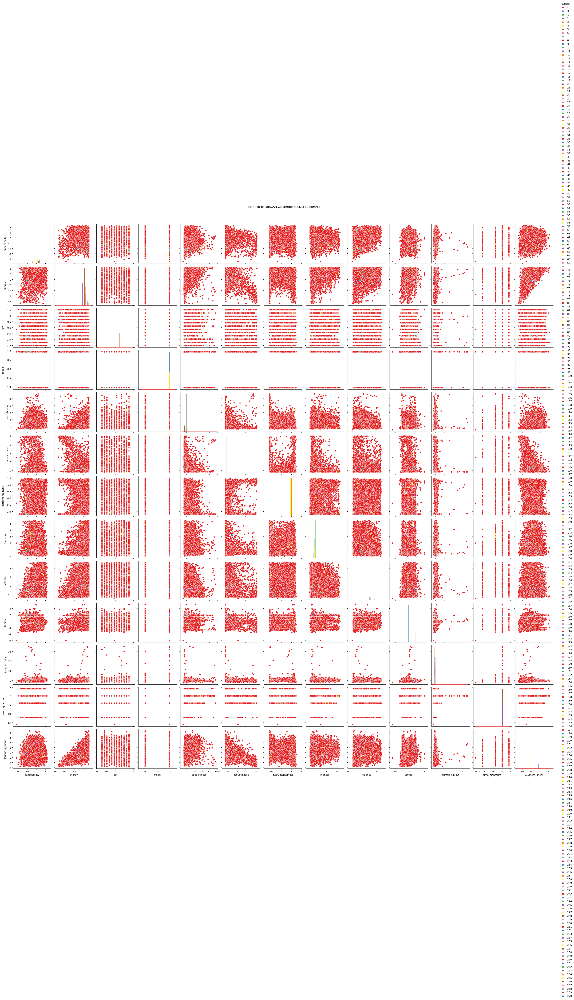

In [ ]:
# Combine the standardized_data and labels into a single DataFrame
data_with_labels = pd.DataFrame(data=standardized_data, columns=['danceability', 'energy', 'key', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_mins',
       'time_signature', 'loudness_linear'])  
data_with_labels['Cluster'] = labels

# Create a pair plot with color-coded clusters
sns.pairplot(data=data_with_labels, hue='Cluster', palette='Set1') 

# Set the title and display the pair plot
plt.suptitle('Pair Plot of DBSCAN Clustering of EDM Subgenres', y=1.02)
plt.show()


### Hierarchical Clustering



As you can see in the below dendrogram, there are many many branches, almost seeming infinite as you go down each level. The orange and red chunks are most similar to each other as they branch off from the same starting point. The same goes for the purple and brown branches. Overall, it is difficult to make concrete conclusions based on the dendrogram, and as for many of the other unsupervised methods we used, they are not the best algorithms for this type of data. 

In [ ]:
from scipy.spatial.distance import pdist

# Calculate the pairwise distance matrix based on standardized_data
distance_matrix = pdist(standardized_data, metric='euclidean')


linkage_matrix = linkage(standardized_data, method='ward')


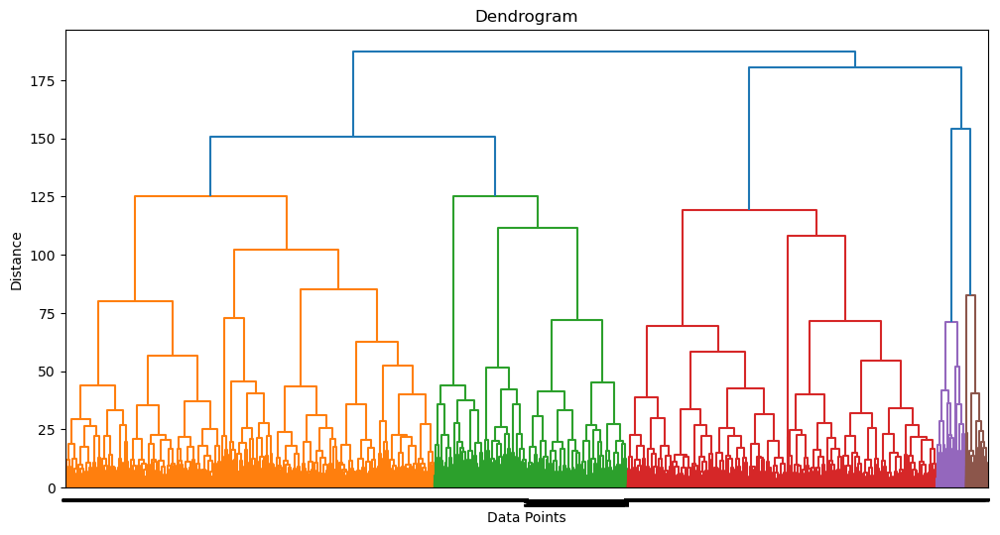

In [ ]:
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, labels=opt_labels, orientation='top', color_threshold=None)
plt.title('Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Distance')
plt.show()
